In [26]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
pd.set_option('display.max_columns', None)
#import itertools

import warnings
warnings.filterwarnings('ignore')
import econml
from econml.orf import DMLOrthoForest, DROrthoForest
from econml.sklearn_extensions.linear_model import WeightedLassoCVWrapper, WeightedLasso, WeightedLassoCV
from sklearn.linear_model import Lasso, LassoCV, LogisticRegression, LogisticRegressionCV, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
import itertools
from itertools import product

In [3]:
# from econml.metalearners import TLearner
# from econml.cate_interpreter import SingleTreeCateInterpreter, SingleTreePolicyInterpreter

In [3]:
df = pd.read_csv("bpi2017_final.csv")

In [ ]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=11101)

In [5]:
feature_names = ['NumberOfOffers', 'Action', 'org:resource',
       'concept:name', 'EventOrigin', 'lifecycle:transition', 'time:timestamp',
       'case:LoanGoal', 'case:ApplicationType', 'case:RequestedAmount',
       'FirstWithdrawalAmount', 'NumberOfTerms', 'Accepted', 'MonthlyCost',
       'CreditScore', 'OfferedAmount', 'offerNumber','timeApplication', 'weekdayApplication']

In [41]:
scaler = StandardScaler()
features = df_train[feature_names]
cat_confound_cols = ['case:LoanGoal', 'case:ApplicationType']
num_confound_cols = features.columns.difference(cat_confound_cols)
W1 = scaler.fit_transform(features[[c for c in num_confound_cols]].to_numpy())
W2 = pd.get_dummies(features[cat_confound_cols]).to_numpy()
W = np.concatenate([W1, W2], axis=1)
X1 = scaler.fit_transform(features[[c for c in num_confound_cols]].to_numpy())
X2 = pd.get_dummies(features[cat_confound_cols]).to_numpy()
X = np.concatenate([X1, X2], axis=1)


X_train = df_train[feature_names]
Y_train = df_train['offerSuccess'].values.ravel()
T_train = df_train['treatmentOffer'].values.ravel()

Y_test = df_test['offerSuccess']
Y_test1 = Y_test[df_test['treatmentOffer'] == 1]
Y_test0 = Y_test[df_test['treatmentOffer'] == 0]

X_test = df_test[feature_names]

In [31]:
n_trees = 600
min_leaf_size = 20
max_depth = 50
subsample_ratio = 0.4
lambda_reg = 0.1

N_trees = [200]
Min_leaf_size = [20]
Max_depth = [50]
Subsample_ratio = [0.4]
Lambda_reg = [0.01]

In [32]:
for i in itertools.product(N_trees, Min_leaf_size, Max_depth, Subsample_ratio, Lambda_reg):
    print(i)
    n_trees = i[0]
    min_leaf_size = i[1]
    max_depth = i[2]
    subsample_ratio = i[3]
    lambda_reg = i[4]
    est = DMLOrthoForest(
        n_trees=n_trees, min_leaf_size=min_leaf_size, max_depth=max_depth, 
        subsample_ratio=subsample_ratio, discrete_treatment=True,
        model_T=LogisticRegression(C=1/(X_train.shape[0]*lambda_reg), penalty='l1', solver='saga'),
        model_Y=Lasso(alpha=lambda_reg),
        model_T_final=LogisticRegression(C=1/(X_train.shape[0]*lambda_reg), penalty='l1', solver='saga'), 
        model_Y_final=WeightedLasso(alpha=lambda_reg),
        random_state=106
       )
    
    ortho_model = est.fit(YY_train, T_train, X=X_train, W=W)
#     batches = np.array_split(X_test, X_test.shape[0] / 100)
#     treatment_effects = est.const_marginal_effect(batches[0])
#     ii = 0
#     for batch in batches[1:]:
# #         print(ii)
#         estimates = est.const_marginal_effect(batch)
#         treatment_effects = np.append(treatment_effects, estimates)
#         ii += 1
#     df_results = test
#     df_results['Treatment Effects'] = treatment_effects

(200, 20, 50, 0.4, 0.01)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

TypeError: econml.utilities.reshape_Y_T() argument after * must be an iterable, not NoneType

In [44]:
treatment_effects = est.effect(X_test)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

TypeError: econml.utilities.reshape_Y_T() argument after * must be an iterable, not NoneType

In [45]:
ate = est.ate(X_test)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

TypeError: econml.utilities.reshape_Y_T() argument after * must be an iterable, not NoneType

In [20]:
estEcon = DMLOrthoForest(
    n_trees=1000, min_leaf_size=5,
    max_depth=50, subsample_ratio=subsample_ratio,
    model_T=Lasso(alpha=lambda_reg),
    model_Y=Lasso(alpha=lambda_reg),
    model_T_final=WeightedLasso(alpha=lambda_reg),
    model_Y_final=WeightedLasso(alpha=lambda_reg),
    global_residualization=False,
    random_state=123)

In [ ]:
ortho_model = estEcon.fit(Y_train, T_train, X=X, W=W)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing

In [ ]:
treatment_effects = est.const_marginal_effect(X_train)

(200, 20, 30, 0.4, 0.01)


TypeError: fit() takes 3 positional arguments but 4 were given

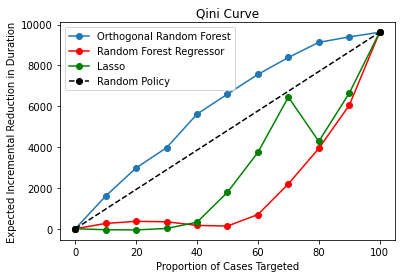

In [13]:
# df_results = test
# df_results['Treatment Effects'] = treatment_effects


pred = Lasso()
pred.fit(X, Y)

pred2 = RandomForestRegressor()
pred2.fit(X, Y)

yhat_test = pred.predict(X_test)
df_results['predictions_lasso'] = yhat_test

yhat_test2 = pred2.predict(X_test)
df_results['predictions_RF'] = yhat_test2

net_value = [0]
net_value2 = [0]
net_value3 = [0]

percentages = [10,20,30,40,50,60,70,80,90,100]

for n in percentages:
    num = int(len(df_results)*(n/100))
    top_n = df_results.nsmallest(num,'Treatment Effects')
    n_treated = top_n[top_n['treatment']==1].shape[0]
    n_control = top_n[top_n['treatment']==0].shape[0]
    scale_factor = n_treated/n_control

    treated = top_n[top_n['treatment']==1]['duration'].sum()
    control = top_n[top_n['treatment']==0]['duration'].sum()

    reduction = (scale_factor*control) - treated 
    net_value.append(reduction)


for n in percentages:
    num = int(len(df_results)*(n/100))
    top_n = df_results.nlargest(num,'predictions_lasso')
    n_treated = top_n[top_n['treatment']==1].shape[0]
    n_control = top_n[top_n['treatment']==0].shape[0]
    scale_factor = n_treated/n_control

    treated = top_n[top_n['treatment']==1]['duration'].sum()
    control = top_n[top_n['treatment']==0]['duration'].sum()

    reduction = (scale_factor*control) - treated 
    net_value2.append(reduction)
    
for n in percentages:
    num = int(len(df_results)*(n/100))
    top_n = df_results.nlargest(num,'predictions_RF')
    n_treated = top_n[top_n['treatment']==1].shape[0]
    n_control = top_n[top_n['treatment']==0].shape[0]
    scale_factor = n_treated/n_control

    treated = top_n[top_n['treatment']==1]['duration'].sum()
    control = top_n[top_n['treatment']==0]['duration'].sum()

    reduction = (scale_factor*control) - treated 
    net_value3.append(reduction)


plt.plot([0]+percentages, net_value, label="Orthogonal Random Forest", marker="o")
plt.plot([0]+percentages, net_value3, label="Random Forest Regressor", marker="o", color='Red')
plt.plot([0]+percentages, net_value2, label="Lasso", marker="o", color='Green')
plt.plot([0,percentages[9]], [0,net_value[10]], label="Random Policy",  marker="o", color='Black',
         linestyle='dashed')
plt.xlabel('Proportion of Cases Targeted')
plt.ylabel('Expected Incremental Reduction in Duration')
plt.legend(loc='best')
plt.title('Qini Curve')

plt.savefig('Results/bpic_17_qini_withBaseline', format='png', dpi=300)


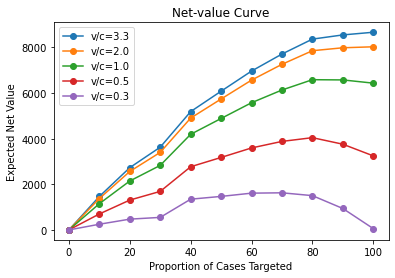

In [14]:
value = [1]
cost = [3,1,2,0.5,0.2]
cost = [0.3,0.5,1,2,3]

percentages = [10,20,30,40,50,60,70,80,90,100]

for i in itertools.product(value, cost):
    net_value = [0]
    v = i[0]
    c = i[1]
    for n in percentages:
        num = int(len(df_results)*(n/100))
        top_n = df_results.nsmallest(num,'Treatment Effects')
        n_treated = top_n[top_n['treatment']==1].shape[0]
        n_control = top_n[top_n['treatment']==0].shape[0]
        scale_factor = n_treated/n_control

        treated = top_n[top_n['treatment']==1]['duration'].sum()
        control = top_n[top_n['treatment']==0]['duration'].sum()

        reduction = (scale_factor*control) - treated
        net_val = (reduction*v) - (n_treated*c) 
        net_value.append(net_val)
    #     net_value.append(reduction)

    # plt.figure(figsize=(10, 4))
    # plt.subplot(1, 2, 1)
    plt.plot([0]+percentages, net_value, label="v/c=%s"%str(round(v/c,1)), marker="o")
#     plt.plot([0,percentages[9]], [0,net_value[10]], label="'Random Policy",  marker="o", color='Gray',
#              linestyle='dashed')
    plt.xlabel('Proportion of Cases Targeted')
    plt.ylabel('Expected Net Value')
    plt.legend(loc='best')
    plt.title('Net-value Curve')

plt.savefig('Results/bpic_17_netValue.png', format='png', dpi=300)